In [107]:
temp = np.zeros(shape=(n_vertex, n_vertex))
np.fill_diagonal(temp, A)

In [106]:
A = A.reshape(-1,1)
A.shape

(6449, 1)

In [1]:
csr_matrix((A, (dia_idx, dia_idx)), shape=(n_vertex, n_vertex), dtype=dtype)

NameError: name 'csr_matrix' is not defined

In [79]:
# dtype = np.float32
# n_eigs = 50

# n_vertex = random_meshes[0].num_vertices
# all_evecs = np.zeros(shape=(n_meshes, n_vertex, n_eigs), dtype=dtype)
# all_evals = np.zeros(shape=(n_meshes, n_eigs), dtype=dtype)

# for i, in_m in enumerate(random_meshes):
#     lb = Laplace_Beltrami(in_m)
#     all_evals[i], all_evecs[i] = lb.spectra(n_eigs)
    
all_areas = []
# dia_idx = np.arange(n_vertex)
for i, in_m in enumerate(random_meshes):    
    A = in_m.area_of_vertices().reshape(-1)
    temp = np.zeros(shape=(n_vertex, n_vertex))
    
    all_areas
#     all_areas.append(csr_matrix((A, (dia_idx, dia_idx)), shape=(n_vertex, n_vertex), dtype=dtype))
#     all_areas[-1] = all_areas[-1].toarray() # MAKE-dense

KeyboardInterrupt: 

In [26]:
n_edges = 200
gg = gnm_random_graph(n_meshes, n_edges)
is_directed = False
g = Graph(gg, is_directed)

In [28]:
s, t = g.edges()

In [67]:
all_fmaps = []
for i, j in zip(s, t):
    all_fmaps.append(all_evecs[j].T.dot(all_areas[j]).dot(all_evecs[i]))

KeyboardInterrupt: 

49

In [67]:
Graph.connected_components(g)

(1, array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0], dtype=int32))

In [90]:
for i, j in zip(s,t):    

array([  7.22408295e-05,   2.94213510e+00,   3.74474430e+00,
         5.87171412e+00,   8.91580391e+00,   1.26534224e+01,
         2.09538345e+01,   2.40033474e+01,   3.10710335e+01,
         3.54954224e+01,   3.99027824e+01,   4.79700775e+01,
         5.07640228e+01,   5.71833878e+01,   7.04130554e+01,
         7.86861496e+01,   8.33430786e+01,   9.81574249e+01,
         1.03682907e+02,   1.10973625e+02,   1.13949455e+02,
         1.20610161e+02,   1.28987518e+02,   1.37060349e+02,
         1.38053101e+02,   1.48627396e+02,   1.53411682e+02,
         1.59687744e+02,   1.63950790e+02,   1.68693863e+02,
         1.77043167e+02,   1.80710159e+02,   1.82531982e+02,
         1.95258926e+02,   2.00697830e+02,   2.03793900e+02,
         2.13773605e+02,   2.17137985e+02,   2.31340897e+02,
         2.32973221e+02,   2.41660873e+02,   2.45419754e+02,
         2.50951050e+02,   2.58926819e+02,   2.61802185e+02,
         2.64410095e+02,   2.69194824e+02,   2.72482300e+02,
         2.75630859e+02,

In [46]:
n = 100
g = gnm_random_graph(n, 10, seed=None, directed=False)

<100x100 sparse matrix of type '<type 'numpy.int32'>'
	with 20 stored elements in COOrdinate format>

In [30]:
b = coo_matrix((vals, (source_e, target_e)), shape=(n, n)).toarray()

In [32]:
np.all(g == b)

True

In [63]:
x = in_m.vertices[:, 0]
y = in_m.vertices[:, 1]
z = in_m.vertices[:, 2]
t = in_m.triangles

v_color = evecs[:, 2]
# v_color -= np.min(v_color)
# v_color /= np.max(v_color)

data1=plotly_trisurf(x, y, z, t, colormap=cm.RdBu, plot_edges=False, vertex_color=v_color)

In [64]:
iplot(data1)

In [11]:
# for i in np.where(in_labels[rid_x] == 4)[0]:
#     plot_mesh(random_meshes[i])

# for i in np.where(in_labels[rid_x] == 7)[0]:
#     plot_mesh(random_meshes[i])

In [11]:
if do_pose_clf:
    n_classes = n_pose_classes
    in_labels = pose_labels
elif do_unsup_clf:
    unsup_clf = KMeans()
    n_classes = 9
    in_labels = unsup_clf.fit_predict(gt_latent_params, n_classes)
else:
    assert(False)

In [162]:
# splits = prepare_train_test_val(n_shapes, in_labels, train_per, test_per, seed=seed)

# if use_pc: 
#     feeds = in_pcs
# else:
#     feeds = in_diffs

# in_data = make_data(splits, feeds, in_labels)

from tf_lab.data_sets.numpy_dataset import NumpyDataset
def make_data_mixed(in_data, in_pc, class_labels, in_diff):
    res = dict()
    for s in ['train', 'test', 'val']:
        idx = in_data[s].copy()        
        res[s] = NumpyDataset([in_pc[idx], class_labels[idx], in_diff[idx]], ['feed', 'labels', 'ids'])
    return res

in_data = make_data_mixed(splits, in_pcs, in_labels, in_diffs)

['feed', 'labels', 'ids']
['feed', 'labels', 'ids']
['feed', 'labels', 'ids']


In [123]:
use_pc = False
arch = 'conv'

In [176]:
reset_tf_graph()

if use_pc: 
    with tf.variable_scope('pc_based_net') as scope:
        feed_pl = tf.placeholder(tf.float32, shape = (None, n_pc_points, 3) )
        labels_pl = tf.placeholder(tf.int64, shape=[None])                           
        layer = encoder_with_convs_and_symmetry_new(feed_pl, n_filters=[64, 128], b_norm=False)
        layer = fully_connected(layer, 64, activation='relu', weights_init='xavier')
        logits = fully_connected(layer, n_classes, activation='linear', weights_init='xavier')
else:
    labels_pl = tf.placeholder(tf.int64, shape=[None])
    diff_dims = (60, 30)
    feed_pl_1 = tf.placeholder(tf.float32, shape = (None, n_pc_points, 3) )
    feed_pl_2 = tf.placeholder(tf.float32, shape = (None, ) + diff_dims)
    
    layer_pc = encoder_with_convs_and_symmetry_new(feed_pl_1, n_filters=[64, 128], b_norm=False)
    
    
    layer = conv_2d(tf.expand_dims(feed_pl_2, -1), nb_filter=4, filter_size=4, activation='relu')
    layer = max_pool_2d(layer, kernel_size=2)
    layer = conv_2d(layer, nb_filter=4, filter_size=3, activation='relu')
    layer = max_pool_2d(layer, kernel_size=2)
    layer = fully_connected(layer, 6, activation='relu', weights_init='xavier')    
    layer_diff = fully_connected(layer, 64, activation='relu', weights_init='xavier')
    layer = tf.concat([layer_pc, layer_diff], axis=1)    
    layer = fully_connected(layer, 32, activation='relu', weights_init='xavier')
    logits = fully_connected(layer, n_classes, activation='linear', weights_init='xavier')
    
#     diff_dims = in_data['train'].feed[0].shape    
#     with tf.variable_scope('diff_based_net') as scope:
#         feed_pl = tf.placeholder(tf.float32, shape = (None, ) + diff_dims)
#         labels_pl = tf.placeholder(tf.int64, shape=[None])
    
#         if arch == 'mlp':
#             layer = fully_connected(feed_pl, 4, activation='relu', weights_init='xavier')
#             layer = fully_connected(layer, 6, activation='relu', weights_init='xavier')
#             logits = fully_connected(layer, n_classes, activation='linear', weights_init='xavier')

#         elif arch == 'conv':
#             layer = conv_2d(tf.expand_dims(feed_pl, -1), nb_filter=4, filter_size=4, activation='relu')
#             layer = max_pool_2d(layer, kernel_size=2)
#             layer = conv_2d(layer, nb_filter=4, filter_size=3, activation='relu')
#             layer = max_pool_2d(layer, kernel_size=2)
#             layer = fully_connected(layer, 12, activation='relu', weights_init='xavier')
#             logits = fully_connected(layer, n_classes, activation='linear', weights_init='xavier')
#         else:
#             assert(False)

print count_trainable_parameters()

18599


In [177]:
prediction = tf.argmax(logits, axis=1)
target_ = labels_pl
correct_pred = tf.equal(prediction, target_)
avg_accuracy = tf.reduce_mean(tf.cast(correct_pred, tf.float32))
one_hot_labels = tf.one_hot(labels_pl, depth=n_classes)
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits=logits, labels=one_hot_labels)
loss = tf.reduce_mean(cross_entropy)

learning_rate = 0.001
opt = tf.train.AdamOptimizer(learning_rate)
opt_step = opt.minimize(loss)

config = tf.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.Session(config=config)
init=tf.global_variables_initializer()
sess.run(init)

In [178]:
n_epochs = 250
batch_size = 50

train_losses = []
val_losses = []
test_losses = []

train_data = in_data['train']
val_data = in_data['val']
test_data = in_data['test']

batches_for_epoch = train_data.n_examples / batch_size
train_res = defaultdict(list)

In [179]:
for epoch in range(n_epochs):    
    for _ in range(batches_for_epoch):        
        batch_d, batch_l, _ = train_data.next_batch(batch_size)
        feed_dict = {feed_pl:batch_d, labels_pl:batch_l}
        sess.run([opt_step, loss, avg_accuracy], feed_dict=feed_dict)
    
    print epoch,
    for s in ['train', 'test', 'val']:
        feed_dict = {feed_pl:in_data[s].feed, labels_pl:in_data[s].labels}
        r = sess.run([avg_accuracy], feed_dict=feed_dict)        
        train_res[s].append(r)
        print r,
    print

TypeError: Cannot interpret feed_dict key as Tensor: Tensor Tensor("diff_based_net/Placeholder:0", shape=(?, 60, 30), dtype=float32) is not an element of this graph.

In [205]:
for epoch in range(n_epochs):
    for _ in range(batches_for_epoch):        
        batch_d, batch_l, batch_dd = train_data.next_batch(batch_size)
        feed_dict = {feed_pl_1:batch_d, labels_pl:batch_l, feed_pl_2:batch_dd}
        sess.run([opt_step, loss, avg_accuracy], feed_dict=feed_dict)
    
    print epoch,
    for s in ['train', 'test', 'val']:
        feed_dict = {feed_pl_1:in_data[s].feed, labels_pl:in_data[s].labels, feed_pl_2:in_data[s].ids}
        r = sess.run([avg_accuracy], feed_dict=feed_dict)        
        train_res[s].append(r)
        print r,
    print

0 [0.95833337] [0.81111109] [0.85000002]
1 [0.93854171] [0.78333342] [0.85000002]
2 [0.90312505] [0.77777791] [0.83333337]
3 [0.95000005] [0.80000001] [0.85000002]
4 [0.96145827] [0.81666672] [0.86666673]
5 [0.94062495] [0.78333342] [0.83333337]
6 [0.90312493] [0.79444444] [0.83333337]
7 [0.94270831] [0.81111121] [0.81666672]
8 [0.96250004] [0.80555564] [0.85000002]
9 [0.94791663] [0.81111115] [0.86666673]
10 [0.95208335] [0.79444456] [0.86666673]
11 [0.96145833] [0.80555558] [0.86666673]
12 [0.95937508] [0.80555564] [0.88333344]
13 [0.92916667] [0.79444444] [0.80000007]
14 [0.96249998] [0.81666672] [0.86666673]
15 [0.9260416] [0.78888893] [0.81666672]
16 [0.94270831] [0.78888899] [0.86666673]
17 [0.8708334] [0.76666677] [0.80000007]
18 [0.9375] [0.79444444] [0.80000007]
19 [0.94999999] [0.81111121] [0.88333344]
20 [0.94687504] [0.80555558] [0.83333337]
21 [0.95104176] [0.79444444] [0.85000002]
22 [0.95416665] [0.82222229] [0.88333344]
23 [0.95000005] [0.81666672] [0.81666672]
24 [0.96

KeyboardInterrupt: 

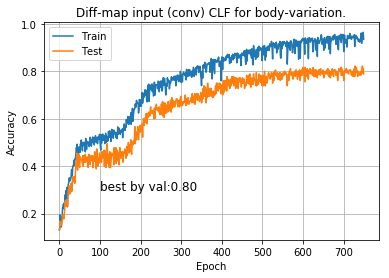

In [204]:
plt.plot(train_res['train'])
plt.plot(train_res['test'])
plt.grid()
plt.legend(['Train', 'Test'])
plt.xlabel('Epoch')

plt.ylabel('Accuracy')
# plt.title('MLP-Diff-Maps CLF for body-variation.')

if use_pc:
    title_tag = 'Raw input'
else:
    title_tag = 'Diff-map input (%s)' % (arch,)

plt.title('%s CLF for body-variation.'% (title_tag, ))

# val_best = train_res['test'][np.argmax(train_res['val'])][0]
val_maximizers = np.where(train_res['val'] == np.max(train_res['val']))[0]
val_best = np.mean(np.array(train_res['test'])[val_maximizers])

plt.text(100, 0.3, 'best by val:%.2f' % (val_best,), fontsize=12);

In [67]:
# feed_dict = {diffs_pl:test_data.diff_maps, labels_pl:test_data.labels}
# pred = sess.run(prediction, feed_dict=feed_dict)
# missed = np.where(test_data.labels != pred)
# pred[missed]
# test_data.labels[missed]
# test_data.ids[missed]

In [ ]:
# import random
# import numpy as np


# class Naive_SBM(object):
#     def __init__(self):
#         pass
# #     def __init__(self, num_vertices, communities, vertex_labels, p_matrix):
# #         self.num_vertices = num_vertices
# #         self.communities = communities
# #         self.vertex_labels = vertex_labels
# #         self.p_matrix = p_matrix
# #         self.block_matrix = self.generate(self.num_vertices, self.communities, self.vertex_labels, self.p_matrix)

#     def generate(self, vertex_labels, p_matrix):
#         print 'Generating SBM (directed graph) ...'
        
#         n_vertices = len(vertex_labels)
#         adjacency = np.zeros(shape=(n_vertices, n_vertices), dtype=np.bool)

#         for row, _row in enumerate(adjacency):
#             for col, _col in enumerate(adjacency[row]):
#                 community_a = vertex_labels[row]
#                 community_b = vertex_labels[col]

#                 p = random.random()
#                 val = p_matrix[community_a][community_b]

#                 if p <= val:
#                     adjacency[row][col] = 1
#                     adjacency[col][row] = 1

#         return adjacency

# in_class_p = 0.1
# out_class_p = in_class_p / (n_classes-1)

# in_class_p = 0.01
# out_class_p = 0.01
# p_matrix = np.ones(shape = (n_classes, n_classes)) * out_class_p
# np.fill_diagonal(p_matrix, in_class_p)

# sbm = Naive_SBM()
# adj = sbm.generate(sorted(in_labels), p_matrix)

In [ ]:
# import plotly.plotly as py

from plotly.graph_objs import *
import numpy as np
import matplotlib.cm as cm
    
def plotly_trisurf(x, y, z, simplices, colormap=cm.RdBu, plot_edges=None,
                  vertex_color=None):
    #x, y, z are lists of coordinates of the triangle vertices 
    #simplices are the simplices that define the triangularization;
    #simplices  is a numpy array of shape (no_triangles, 3)
    #insert here the  type check for input data
    
    points3D=np.vstack((x,y,z)).T
    tri_vertices=map(lambda index: points3D[index], simplices)# vertices of the surface triangles         
    I,J,K = ([triplet[c] for triplet in simplices] for c in range(3))
    
    triangles=Mesh3d(x=x,
                     y=y,
                     z=z,
                     vertexcolor=vertex_color, 
                     i=I,
                     j=J,
                     k=K,
                     name=''
                    )
    
    if plot_edges is None:# the triangle sides are not plotted 
        return Data([triangles])
    else:
        #define the lists Xe, Ye, Ze, of x, y, resp z coordinates of edge end points for each triangle
        #None separates data corresponding to two consecutive triangles
        lists_coord=[[[T[k%3][c] for k in range(4)]+[ None]   for T in tri_vertices]  for c in range(3)]
        Xe, Ye, Ze=[reduce(lambda x,y: x+y, lists_coord[k]) for k in range(3)]
        
        #define the lines to be plotted
        lines=Scatter3d(x=Xe,
                        y=Ye,
                        z=Ze,
                        mode='lines',
                        line=Line(color= 'rgb(50,50,50)', width=1.5)
               )
        return Data([triangles, lines])